# Importar librerias

In [172]:
import pandas as pd
import numpy as np
from quickda.explore_data import *
from quickda.explore_numeric import *
from quickda.explore_categoric import *
from quickda.explore_numeric_categoric import *
import matplotlib.pyplot as plt
import pandas as pd
from pandas_profiling import ProfileReport
import seaborn as sns

%matplotlib inline

# Leer la información y los nombres de las columnas

In [173]:
data = pd.read_csv("breast-cancer-wisconsin.data", header=None)

with open("breast-cancer-wisconsin.names") as file:
    columnNames = [line.rstrip().split("  ")[0] for line in file]

data.columns = columnNames

# Verificar si hay datos nulos

In [174]:
print("Hay datos nulos?", data.isnull().values.any())

Hay datos nulos? False


## 1.1 Haga una exploración rápida de sus datos para eso haga un resumen de su dataset.

In [175]:
data.head()

,Sample code number,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bare Nuclei,Bland Chromatin,Normal Nucleoli,Mitoses,Class
0,1000025,5,1,1,1,2,1,3,1,1,2
1,1002945,5,4,4,5,7,10,3,2,1,2
2,1015425,3,1,1,1,2,2,3,1,1,2
3,1016277,6,8,8,1,3,4,3,7,1,2
4,1017023,4,1,1,3,2,1,3,1,1,2


In [176]:
explore(data, method="summarize")

d:\Archivos de programa\Python\3.10\lib\site-packages\quickda\explore_data.py:27: FutureWarning:

The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

d:\Archivos de programa\Python\3.10\lib\site-packages\quickda\explore_data.py:28: FutureWarning:

The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

d:\Archivos de programa\Python\3.10\lib\site-packages\quickda\explore_data.py:29: FutureWarning:

The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,dtypes,count,null_sum,null_pct,nunique,min,25%,50%,75%,max,mean,median,std,skew
Bare Nuclei,object,699,0,0.0,11,1,-,-,-,?,-,-,-,-
Bland Chromatin,int64,699,0,0.0,10,1,2.0,3.0,5.0,10,3.437768,3.0,2.438364,1.099969
Class,int64,699,0,0.0,2,2,2.0,2.0,4.0,4,2.689557,2.0,0.951273,0.654564
Clump Thickness,int64,699,0,0.0,10,1,2.0,4.0,6.0,10,4.41774,4.0,2.815741,0.592859
Marginal Adhesion,int64,699,0,0.0,10,1,1.0,1.0,4.0,10,2.806867,1.0,2.855379,1.524468
Mitoses,int64,699,0,0.0,9,1,1.0,1.0,1.0,10,1.589413,1.0,1.715078,3.560658
Normal Nucleoli,int64,699,0,0.0,10,1,1.0,1.0,4.0,10,2.866953,1.0,3.053634,1.422261
Sample code number,int64,699,0,0.0,645,61634,870688.5,1171710.0,1238298.0,13454352,1071704.098712,1171710.0,617095.729819,13.675326
Single Epithelial Cell Size,int64,699,0,0.0,10,1,2.0,2.0,4.0,10,3.216023,2.0,2.2143,1.712172
Uniformity of Cell Shape,int64,699,0,0.0,10,1,1.0,1.0,5.0,10,3.207439,1.0,2.971913,1.161859


In [177]:
data.describe()

,Sample code number,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bland Chromatin,Normal Nucleoli,Mitoses,Class
count,6.990000e+02,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000
mean,1.071704e+06,4.417740,3.134478,3.207439,2.806867,3.216023,3.437768,2.866953,1.589413,2.689557
std,6.170957e+05,2.815741,3.051459,2.971913,2.855379,2.214300,2.438364,3.053634,1.715078,0.951273
min,6.163400e+04,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000
25%,8.706885e+05,2.000000,1.000000,1.000000,1.000000,2.000000,2.000000,1.000000,1.000000,2.000000
50%,1.171710e+06,4.000000,1.000000,1.000000,1.000000,2.000000,3.000000,1.000000,1.000000,2.000000
75%,1.238298e+06,6.000000,5.000000,5.000000,4.000000,4.000000,5.000000,4.000000,1.000000,4.000000
max,1.345435e+07,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,4.000000


In [178]:
from pandas_profiling import ProfileReport
ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 1.2. Diga el tipo de cada una de las variables del dataset (cualitativa o categórica, cuantitativa continua, cuantitativa discreta)

Como se puede observar en el resumen anterior, existen 11 variables en el dataset. 9 de estas son numericas y 2 son categoricas.

Categoricas:
  - Class
  - Sample code number

Cuantitativas:
  - Clumb Thickness (discreta)
  - Uniformity of cell Size (discreta)
  - Uniformity of Cell Shape (discreta)
  - Marginal Adhesion (discreta)
  - Single Epithelial Cell Size (discreta)
  - Single Epithelial Cell Size (discreta)
  - Bland Chromatin (discreta)
  - Normal Nucleoli (discreta) 
  - Mitoses (discreta)


clump_thickness
uniformity_of_cell_size
uniformity_of_cell_shape
marginal_adhesion
single_epithelial_cell_size
bland_chromatin
normal_nucleoli
mitoses

## 1.3. Incluya los gráficos exploratorios siendo consecuentes con el tipo de variable queestán representando.

Outlier Analysis - Boxplot


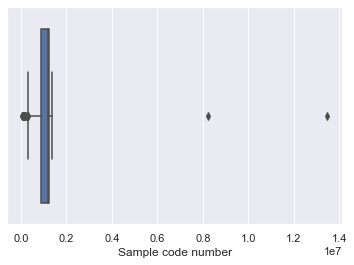

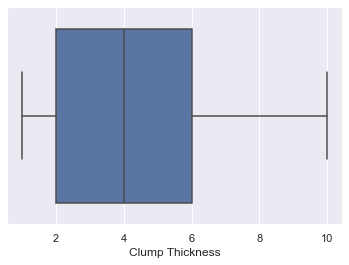

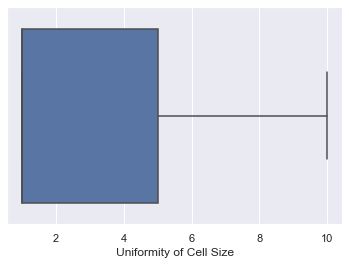

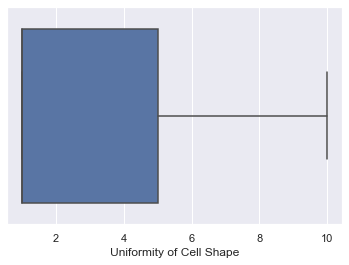

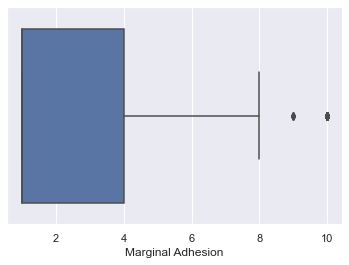

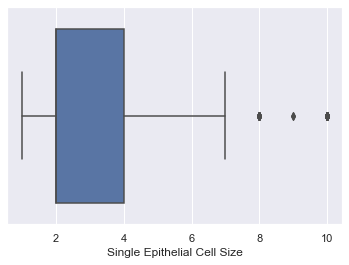

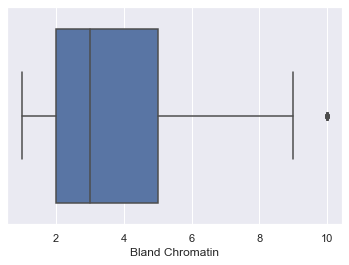

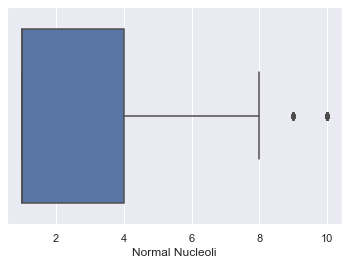

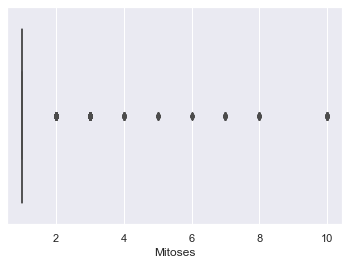

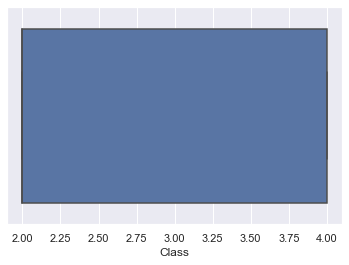

Distribution Analysis - Histogram


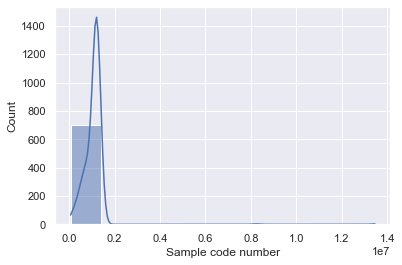

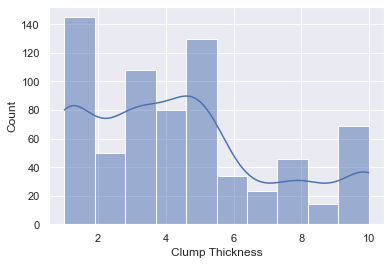

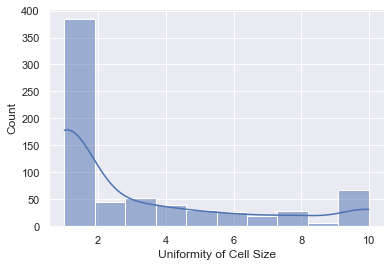

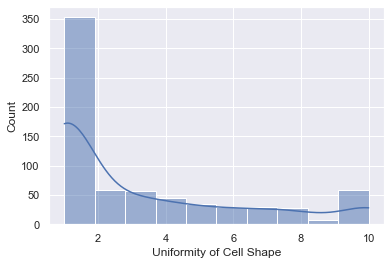

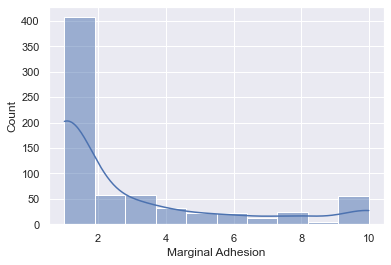

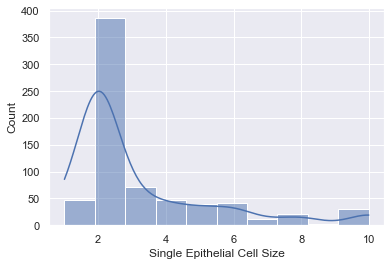

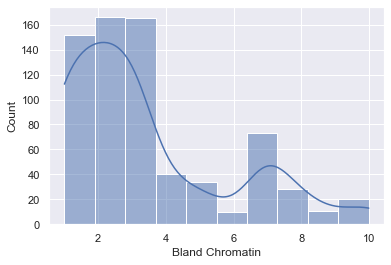

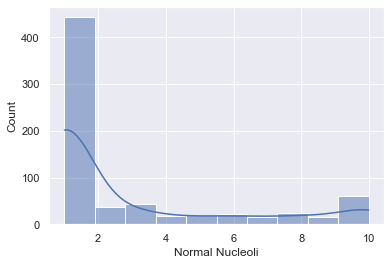

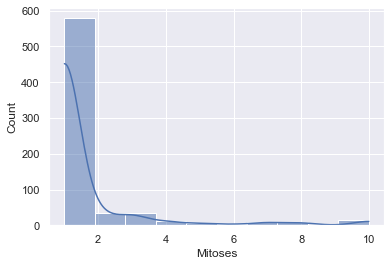

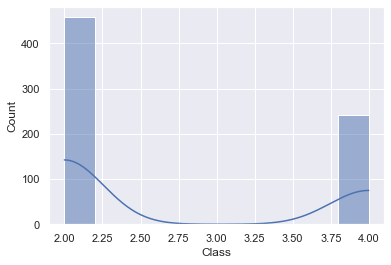

In [179]:
eda_num(data)

## 1.4. Aísle las variables numéricas de las categóricas, haga un análisis de correlación entre las mismas.

In [180]:
eda_num(data, method='correlation')

Correlation Analysis - Heatmap


d:\Archivos de programa\Python\3.10\lib\site-packages\quickda\explore_numeric.py:28: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

d:\Archivos de programa\Python\3.10\lib\site-packages\quickda\explore_numeric.py:30: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



,Sample code number,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bland Chromatin,Normal Nucleoli,Mitoses,Class
Sample code number,1.00,-0.06,-0.04,-0.04,-0.06,-0.05,-0.06,-0.05,-0.03,-0.08
Clump Thickness,-0.06,1.00,0.64,0.65,0.49,0.52,0.56,0.54,0.35,0.72
Uniformity of Cell Size,-0.04,0.64,1.00,0.91,0.71,0.75,0.76,0.72,0.46,0.82
Uniformity of Cell Shape,-0.04,0.65,0.91,1.00,0.68,0.72,0.74,0.72,0.44,0.82
Marginal Adhesion,-0.06,0.49,0.71,0.68,1.00,0.60,0.67,0.60,0.42,0.70
Single Epithelial Cell Size,-0.05,0.52,0.75,0.72,0.60,1.00,0.62,0.63,0.48,0.68
Bland Chromatin,-0.06,0.56,0.76,0.74,0.67,0.62,1.00,0.67,0.34,0.76
Normal Nucleoli,-0.05,0.54,0.72,0.72,0.60,0.63,0.67,1.00,0.43,0.71
Mitoses,-0.03,0.35,0.46,0.44,0.42,0.48,0.34,0.43,1.00,0.42
Class,-0.08,0.72,0.82,0.82,0.70,0.68,0.76,0.71,0.42,1.00


## 1.5. Utilice las variables categóricas, haga tablas de frecuencia, proporción, gráficas de barras o cualquier otra técnica que le permita explorar los datos

In [181]:
eda_cat(data, x='class')

'class'


In [182]:
print('El valor maximo de "sanple code number" es:', data['Sample code number'].max())
print('El valor minimo de "sanple code number" es:', data['Sample code number'].min())

El valor maximo de "sanple code number" es: 13454352
El valor minimo de "sanple code number" es: 61634


## 1.6. Realice la limpieza de variables utilizando las técnicas vistas en clase, u otras que piense pueden ser de utilidad

In [183]:
from quickda.clean_data import clean
data = data.drop([
  'Sample code number'
],axis=1)
data.drop(data[data['Bare Nuclei'] == "?"].index, inplace = True)
data = clean(data, method='standardize')
data = clean(data, method='duplicates')
data

,clump_thickness,uniformity_of_cell_size,uniformity_of_cell_shape,marginal_adhesion,single_epithelial_cell_size,bare_nuclei,bland_chromatin,normal_nucleoli,mitoses,class
0,5,1,1,1,2,1,3,1,1,2
1,5,4,4,5,7,10,3,2,1,2
2,3,1,1,1,2,2,3,1,1,2
3,6,8,8,1,3,4,3,7,1,2
4,4,1,1,3,2,1,3,1,1,2
...,...,...,...,...,...,...,...,...,...,...
693,3,1,1,1,2,1,2,1,2,2
694,3,1,1,1,3,2,1,1,1,2
696,5,10,10,3,7,3,8,10,2,4
697,4,8,6,4,3,4,10,6,1,4


## 2.1. Pruebe los modelos de Regresión Logística y el de K-NN

In [184]:
from sklearn.model_selection import train_test_split
x = data.iloc[:, :-1].values
y = data.iloc[:, -1].values
X_entreno, X_prueba, y_entreno, y_prueba = train_test_split(x, y, test_size = 0.25, random_state = 0)

In [185]:
print(X_entreno)

[[5 1 2 ... 1 1 1]
 [7 3 2 ... 5 4 4]
 [2 3 1 ... 2 1 1]
 ...
 [3 1 1 ... 2 1 1]
 [10 3 6 ... 4 10 2]
 [7 5 6 ... 7 4 1]]


In [186]:
from sklearn.preprocessing import StandardScaler
normalizador = StandardScaler()
X_entreno = normalizador.fit_transform(X_entreno)
X_prueba = normalizador.transform(X_prueba)


In [187]:
print(X_entreno)

[[-0.0824145  -0.97978642 -0.70327096 ... -1.14894249 -0.83220853
  -0.45012236]
 [ 0.6276181  -0.37183031 -0.70327096 ...  0.34014016  0.04895344
   0.98571098]
 [-1.1474634  -0.37183031 -1.01917877 ... -0.77667183 -0.83220853
  -0.45012236]
 ...
 [-0.7924471  -0.97978642 -1.01917877 ... -0.77667183 -0.83220853
  -0.45012236]
 [ 1.692667   -0.37183031  0.56036029 ... -0.0321305   1.81127739
   0.02848876]
 [ 0.6276181   0.23612581  0.56036029 ...  1.08468148  0.04895344
  -0.45012236]]


In [188]:
from sklearn.linear_model import LogisticRegression
clasificador = LogisticRegression(random_state = 0)
clasificador.fit(X_entreno, y_entreno)

LogisticRegression(random_state=0)

In [189]:
print(clasificador.predict(normalizador.transform([[1,1,1,1,1,1,1,1,1]])))

[2]


In [190]:
y_pred = clasificador.predict(X_prueba)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_prueba.reshape(len(y_prueba),1)),1))

[[2 2]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [2 4]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [4 4]
 [4 4]
 [2 4]
 [4 4]
 [2 2]
 [4 2]
 [2 2]
 [2 4]
 [4 4]
 [4 2]
 [4 4]
 [4 4]
 [2 2]
 [4 4]
 [4 4]
 [4 2]
 [4 4]
 [4 4]
 [2 2]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [2 2]
 [4 4]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [2 4]
 [2 2]
 [2 2]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [4 2]
 [4 4]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [4 4]
 [2 2]
 [2 2]
 [4 4]
 [4 4]
 [4 4]
 [2 2]
 [4 4]
 [2 2]
 [2 4]
 [4 4]
 [2 2]
 [4 4]
 [4 4]
 [2 2]
 [2 2]
 [2 2]
 [2 2]
 [4 4]
 [2 2]
 [2 2]
 [2 2]]


In [191]:
from sklearn.metrics import confusion_matrix, accuracy_score
matconf = confusion_matrix(y_prueba, y_pred)
print(matconf)
accuracy_score(y_prueba, y_pred)

[[43  4]
 [ 5 61]]


0.9203539823008849

In [192]:
X_entreno, X_prueba, y_entreno, y_prueba = train_test_split(x, y, test_size = 0.25, random_state = 0)
from sklearn.preprocessing import StandardScaler
normalizador = StandardScaler()
X_entreno = normalizador.fit_transform(X_entreno)
X_prueba = normalizador.transform(X_prueba)

In [193]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors = 1)
knn.fit(X_entreno, y_entreno)

KNeighborsClassifier(n_neighbors=1)

In [194]:
pred = knn.predict(X_prueba)

In [195]:
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_prueba, pred))
print(classification_report(y_prueba, pred))

[[45  2]
 [ 9 57]]
              precision    recall  f1-score   support

           2       0.83      0.96      0.89        47
           4       0.97      0.86      0.91        66

    accuracy                           0.90       113
   macro avg       0.90      0.91      0.90       113
weighted avg       0.91      0.90      0.90       113



In [196]:
tasa_error = []

# Puede tardar un poco
for i in range(1, 40):
    
    knn = KNeighborsClassifier(n_neighbors = i)
    knn.fit(X_entreno, y_entreno)
    pred_i = knn.predict(X_prueba)
    tasa_error.append(np.mean(pred_i != y_prueba))

Text(0, 0.5, 'Tasa de Error')

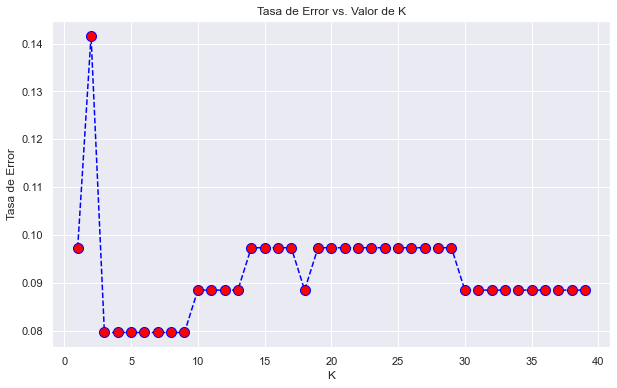

In [197]:
plt.figure(figsize = (10, 6))
plt.plot(range(1, 40), tasa_error, color = 'blue', linestyle = 'dashed', marker = 'o',
         markerfacecolor = 'red', markersize = 10)
plt.title('Tasa de Error vs. Valor de K')
plt.xlabel('K')
plt.ylabel('Tasa de Error')

Se puede observar que con valores de k entre 2 y 9 aproximadamente, el margen de error es de 0.08. Por esto, se decidió usar k = 9

In [198]:
knn = KNeighborsClassifier(n_neighbors = 9)
knn.fit(X_entreno, y_entreno)
pred = knn.predict(X_prueba)

print('CON K = 9')
print('\n-> Matriz de Confusión')
print(confusion_matrix(y_prueba,pred))
print('\n-> Reporte')
print(classification_report(y_prueba,pred))

CON K = 9

-> Matriz de Confusión
[[45  2]
 [ 7 59]]

-> Reporte
              precision    recall  f1-score   support

           2       0.87      0.96      0.91        47
           4       0.97      0.89      0.93        66

    accuracy                           0.92       113
   macro avg       0.92      0.93      0.92       113
weighted avg       0.92      0.92      0.92       113



## 2.2. ¿Cuál es el modelo con mejor rendimiento? Utilice las métricas vistas en clase para dar respaldo a su respuesta

En este caso, el modelo con mejor rendimiento es el realizado con KNN y k = 9.
Esto debiddo a que tiene valores más altos al momento de mostrar el reporte de clasificación.

> Por ejemplo, el modelo por regresión logistica tiene un accuracy de 0.90 mientras que el del KNN es de 0.92